In [1]:
import numpy
import numpy as np
import time
import datetime
import netCDF4
import matplotlib.pylab as plt
import os,sys,glob
from multiprocessing import Pool
#import odb
from eccodes import *
from functools import partial
from collections import OrderedDict
import subprocess
import json
import gzip
import copy
import pickle
import xarray as xr
import pickle
import pandas as pd
import matplotlib
import matplotlib.pylab as plt
import matplotlib.pyplot as maplt
matplotlib.rcParams.update({'font.size': 20})

plt.rcParams['lines.linewidth'] = 3

import warnings
warnings.filterwarnings('ignore')

sys.path.append(os.getcwd()+'/../cds-backend/code/')
import cds_eua4 as eua
import trajectory as trj

import h5py
import ray
# ray.init(num_cpus=7)


In [2]:
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.pyplot as plt
import matplotlib as mpl
import matplotlib.pylab as pylab
import geopandas as gpd

import matplotlib.pylab as plt
import matplotlib.colors as mcolors
import numpy

def rgb(r,g,b):
    return tuple(numpy.asarray([r,g,b],dtype=numpy.float))

def make_colormap(seq):
    """Return a LinearSegmentedColormap
    seq: a sequence of floats and RGB-tuples. The floats should be increasing
    and in the interval (0,1).
    """
    se = [(None,) * 3, 0.0]
    for s in seq:
        se.append(s[0])
        se.append(s[1])#+ list(seq) +
        seq=se+[ (None,) * 3]
        cdict = {'red': [], 'green': [], 'blue': []}
        for i, item in enumerate(seq):
            if isinstance(item, float):
                r1, g1, b1 = seq[i - 1]
                r2, g2, b2 = seq[i + 1]
                cdict['red'].append([item, r1, r2])
                cdict['green'].append([item, g1, g2])
                cdict['blue'].append([item, b1, b2])
    return mcolors.LinearSegmentedColormap('CustomMap', cdict)

rgblist=["rgb(0,0,0.3)", "rgb(0,0,0.5)",
"rgb(0,0,0.7)", "rgb(0,0,0.9)", "rgb(0,0.15,1)",
"rgb(0,0.3,1)", "rgb(0,0.45,1)", "rgb(0,0.6,1)",
"rgb(0,0.75,1)", "rgb(0,0.85,1)", "rgb(0.2,0.95,1)",
"rgb(0.45,1,1)", "rgb(0.75,1,1)", "rgb(1,1,0)",
"rgb(1,0.9,0)", "rgb(1,0.8,0)", "rgb(1,0.7,0)",
"rgb(1,0.6,0)", "rgb(1,0.5,0)", "rgb(1,0.4,0)",
"rgb(1,0.3,0)", "rgb(1,0.15,0)", "rgb(0.9,0,0)",
"rgb(0.7,0,0)", "rgb(0.5,0,0)", "rgb(0.3,0,0)"]
rgblist2=zip([eval(rgblist[l]) for l in range(len(rgblist))],numpy.linspace(0,1,len(rgblist)))

cmnew=make_colormap(rgblist2)

In [3]:
'''
STAION ME PLOTS

'''

def plot_year_me(path, year, param):
    if not isinstance(path, list):
        path = [path]
    diffs = {}
    difflist = []
    
    import matplotlib
    import matplotlib.pylab as plt
    import matplotlib.pyplot as maplt
    matplotlib.rcParams.update({'font.size': 20})
    plt.rcParams['lines.linewidth'] = 3
    
    stdplevs = [1000,2000,3000,5000,7000,10000,15000,20000,25000,30000,40000,50000,70000,85000,92500]
    diff = True
    show_date = False
    for fi  in list(path):
        with open(fi, 'rb') as file:
            results = pickle.load(file)
        for i in results[:]:


            rmse_sum_shbase_sonde, rmse_sum_shbase_adjsonde, rmse_sum_shdisp_sonde, rmse_sum_shdisp_adjsonde, \
                rms_sum_shbase, rms_sum_adjsonde, rms_sum_sonde, rms_sum_shdisp, rms_sum_dispminusbase, stat_marker \
                = copy.deepcopy(i)

            if (len(stat_marker[50000]) == 0):
                continue

            for k in [1000,2000,3000,5000,7000,10000,15000,20000,25000,30000,40000,50000,70000,85000,92500]:
                rmse_sum_shbase_sonde[k]  = np.array(rmse_sum_shbase_sonde[k])
                rmse_sum_shbase_adjsonde[k]  = np.array(rmse_sum_shbase_adjsonde[k])
                rmse_sum_shdisp_sonde[k]  = np.array(rmse_sum_shdisp_sonde[k])
                rmse_sum_shdisp_adjsonde[k]  = np.array(rmse_sum_shdisp_adjsonde[k])
                rms_sum_shbase[k]  = np.array(rms_sum_shbase[k])
                rms_sum_adjsonde[k]  = np.array(rms_sum_adjsonde[k])
                rms_sum_sonde[k]  = np.array(rms_sum_sonde[k])
                rms_sum_shdisp[k]  = np.array(rms_sum_shdisp[k])
                rms_sum_dispminusbase[k]  = np.array(rms_sum_dispminusbase[k])

            t0 = time.time()
            rmse_shbase_sonde=[]
            rmse_shdisp_sonde=[]
            
            for j in range(len(stdplevs)):

                rmse_shbase_sonde.append(np.nanmean((np.array(rmse_sum_shbase_sonde[stdplevs[j]]))))
                rmse_shdisp_sonde.append(np.nanmean((np.array(rmse_sum_shdisp_sonde[stdplevs[j]]))))

            if param == 'diff':
                diffs[str(stat_marker[50000][0])] = np.array(rmse_shbase_sonde)-np.array(rmse_shdisp_sonde)
                difflist.append(np.array(rmse_shbase_sonde)-np.array(rmse_shdisp_sonde))
            elif param == 'disp':
                diffs[str(stat_marker[50000][0])] = np.array(rmse_shdisp_sonde)
                difflist.append(np.array(rmse_shdisp_sonde))
            elif param == 'undisp':
                diffs[str(stat_marker[50000][0])] = np.array(rmse_shbase_sonde)
                difflist.append(np.array(rmse_shbase_sonde))

    return diffs, difflist



# DIFFERENCE

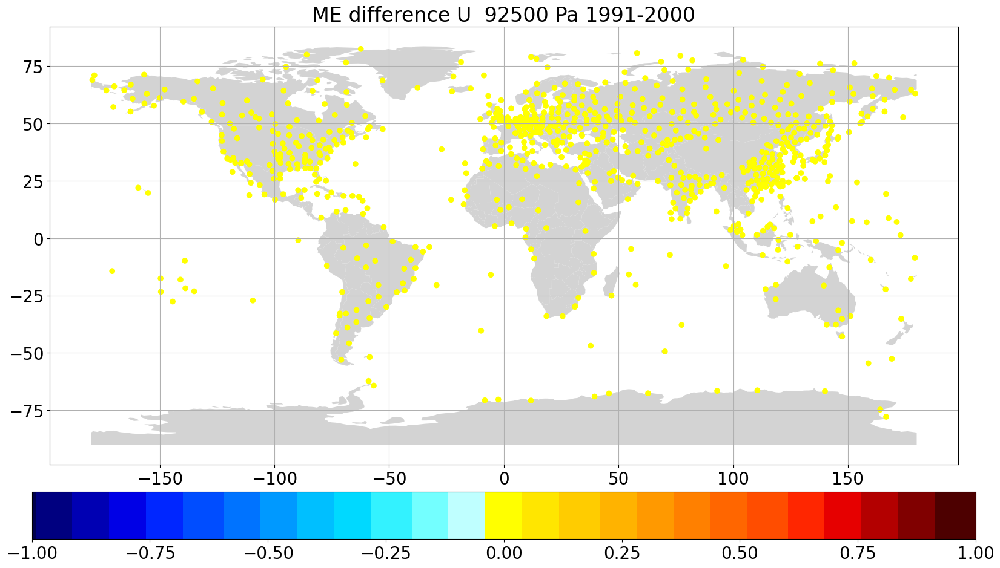

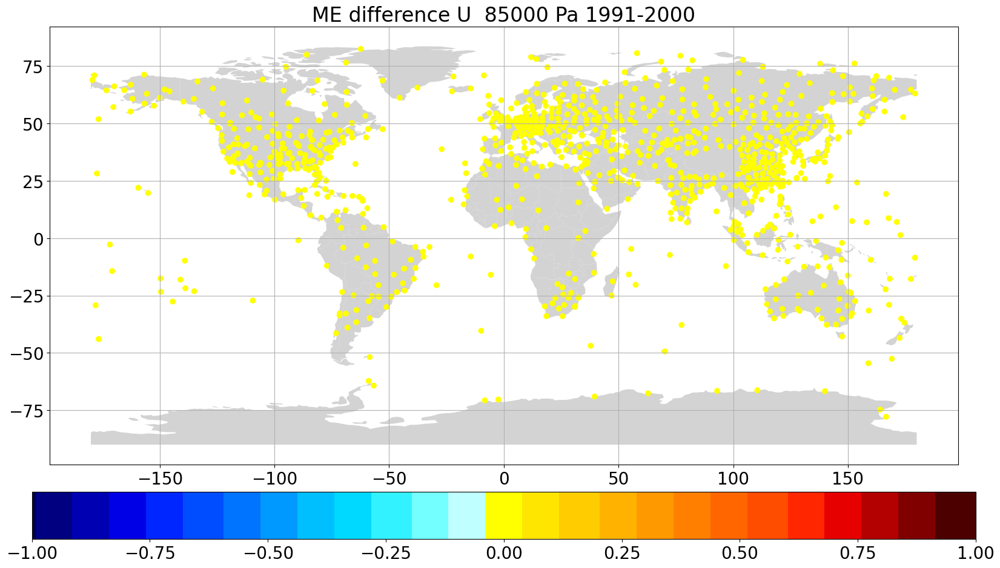

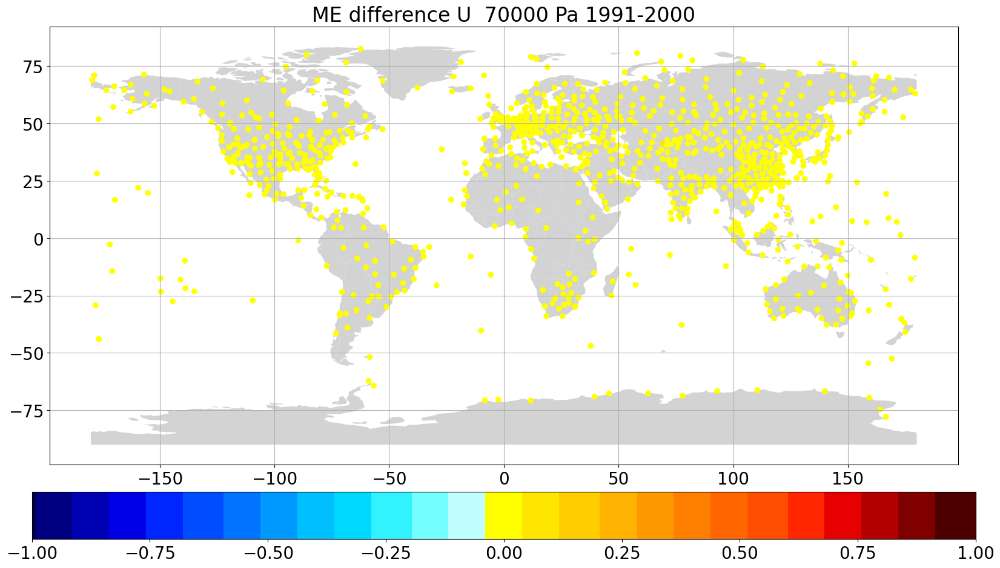

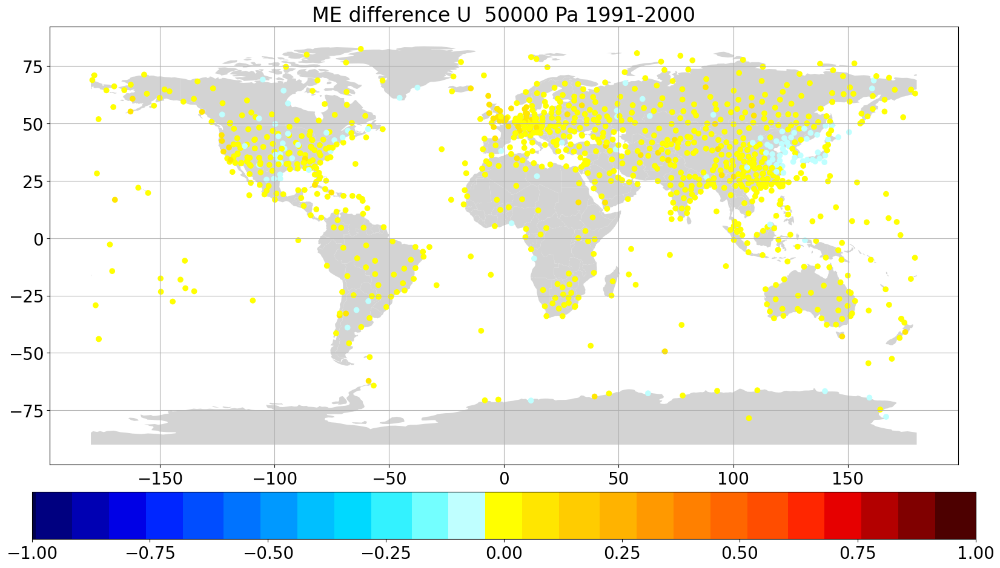

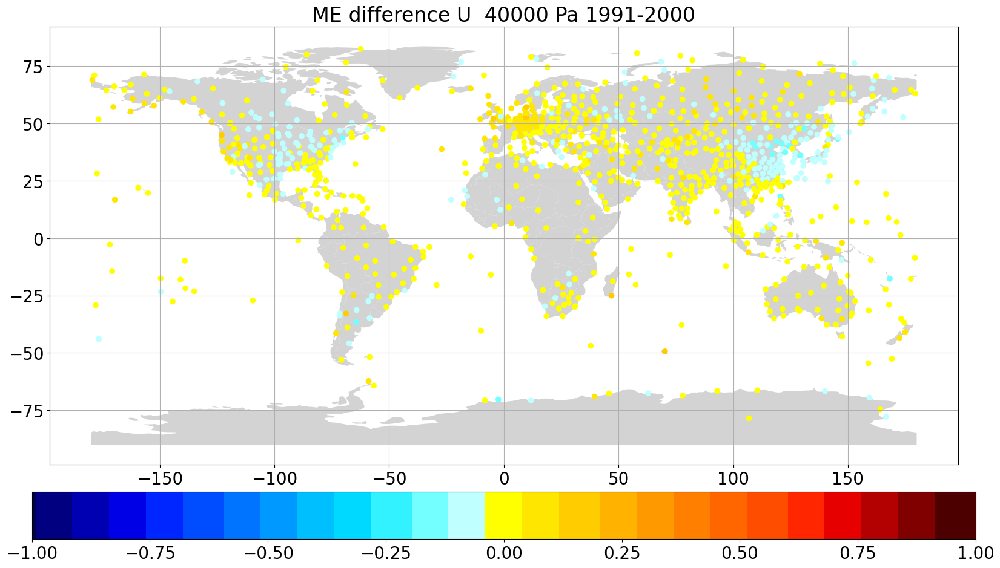

...

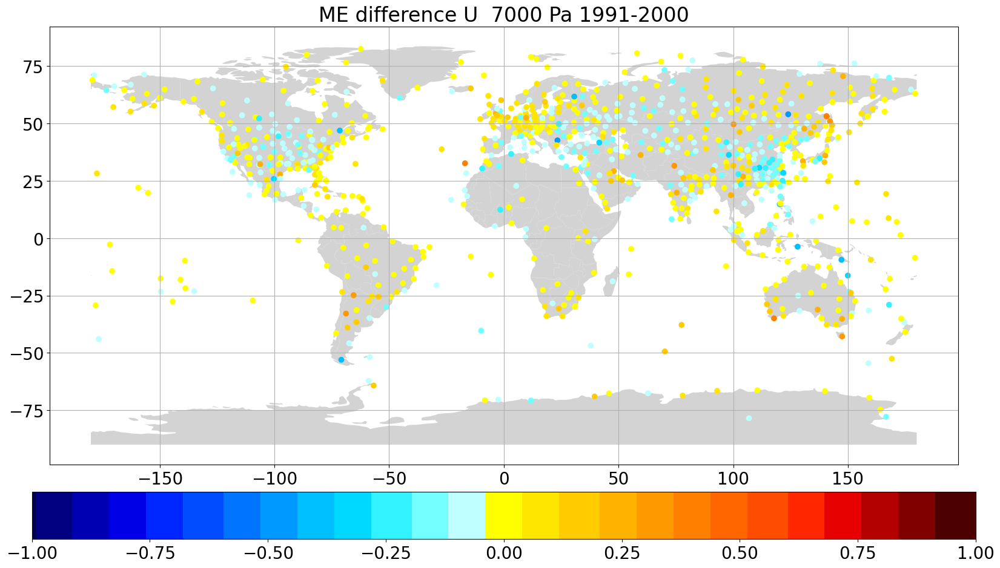

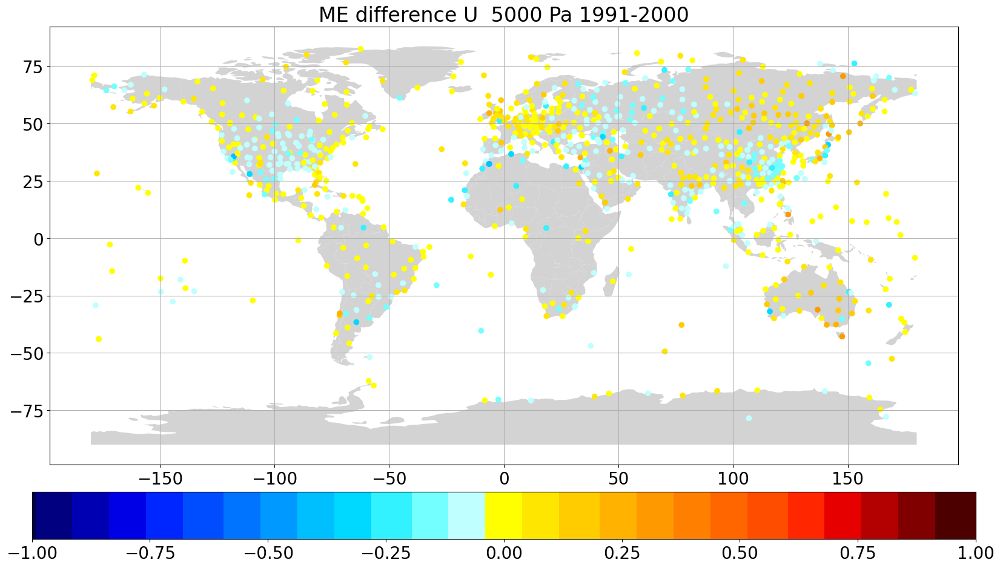

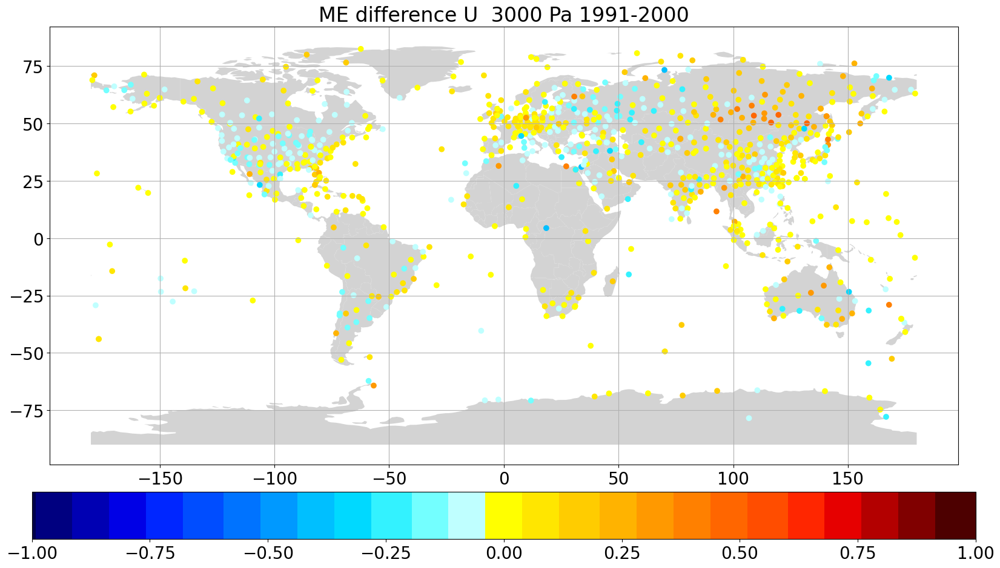

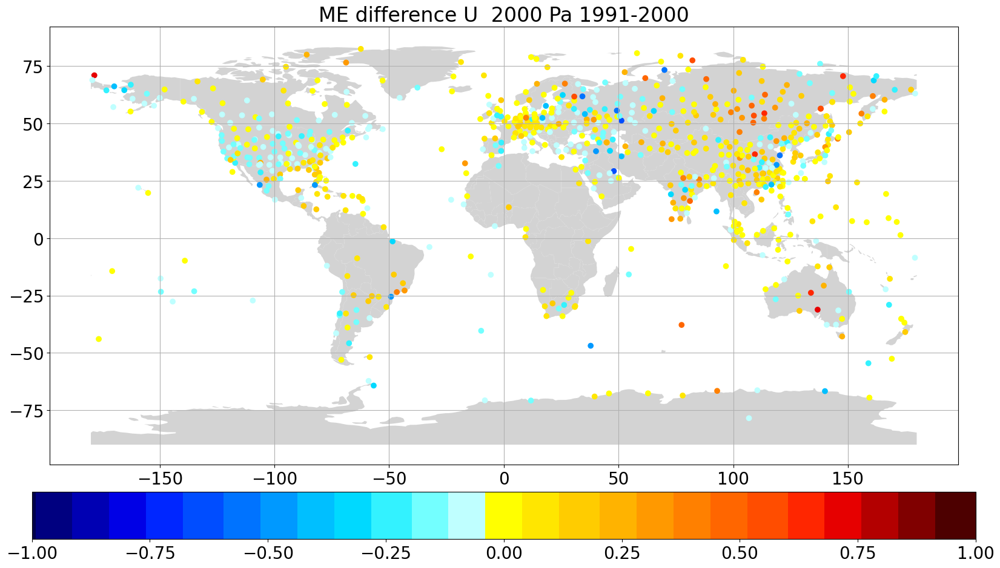

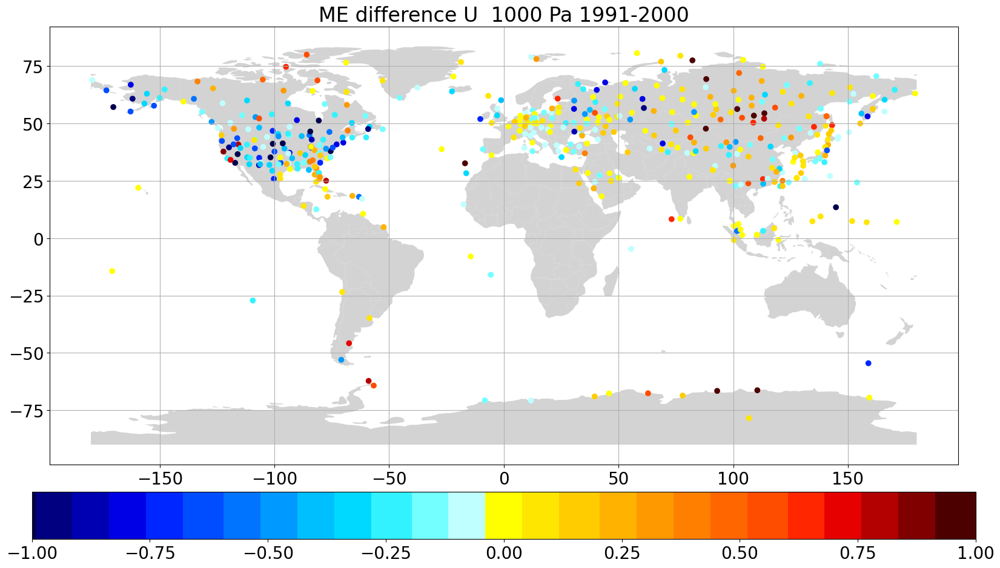

In [4]:
var = 'U'
year = '1991-2000'
files = glob.glob('./pre_calculated_rms data/era5_u_fc_*_rmse_data.p')
diffs, difflist = plot_year_me(files, str(year), param='diff')


diffarray = np.array(difflist)

outlier_cleaned_data = np.empty_like(diffarray)
outlier_cleaned_dict = copy.deepcopy(diffs)
limit = [1,99]
for i in range(np.shape(diffarray)[-1]):
    data = diffarray[:, i]
    outlier_drop = np.nanpercentile(data, limit)
    data[data < outlier_drop[0]] = np.nan
    data[data > outlier_drop[1]] = np.nan
    outlier_cleaned_data[:, i] = data
    
    for j in diffs:
        if (diffs[j][i] < outlier_drop[0]) or (diffs[j][i] > outlier_drop[1]):
            outlier_cleaned_dict[j][i] = np.nan
            
    
# stdplevs = [1000,2000,3000,5000,7000,10000,15000,20000,25000,30000,40000,50000,70000,85000,92500]
# fig, ax = maplt.subplots(5, 3, figsize = (15,15))
# fig.tight_layout()
# x = 0
# y = 0
# for i in range(0,15,1):
#     if y == 3:
#         x += 1
#         y = 0
#     ax[x][y].hist(outlier_cleaned_data[:, i], 50, range=(-1,1))
#     ax[x][y].set_title(str(stdplevs[i]) + ' Pa')
#     ax[x][y].grid()
    
#     y += 1
# # fig.show()
# fig.savefig("ME_difference_"+var+"_hist_" + str(year) + '.png')


# stdplevs = [1000,2000,3000,5000,7000,10000,15000,20000,25000,30000,40000,50000,70000,85000,92500]
# fig, ax = maplt.subplots(5, 3, figsize = (15,15))
# fig.tight_layout()
# x = 0
# y = 0
# for i in range(0,15,1):
#     if y == 3:
#         x += 1
#         y = 0
#     ax[x][y].hist(outlier_cleaned_data[:, i], 2, range=(-1,1))
#     ax[x][y].set_title(str(stdplevs[i]) + ' Pa')
#     ax[x][y].grid()
#     y += 1
# # fig.show()
# fig.savefig("ME_difference_"+var+"_binary_hist_" + str(year) + '.png')


def plt_world_map(lla, pl ,year):    
    fig, ax = plt.subplots(figsize=(18,10))# plot map on axis
    countries = gpd.read_file(  
    #      gpd.datasets.get_path("naturalearth_lowres"))countries[countries["name"] == "Australia"].plot(color="lightgrey",
    #                                                  ax=ax)# parse dates for plot's title
        gpd.datasets.get_path("naturalearth_lowres")).plot(color="lightgrey", ax=ax)# parse dates for plot's title
    plt1 = ax.scatter(x=lla["longitude"], y=lla["latitude"],
                c=lla["diff"], 
                cmap= cmnew,
                vmin=-1, vmax=1, #edgecolor='k',
              )
    ax.set_title("ME difference "+var+" " + ' ' + str(pl) + ' Pa ' + str(year))
    ax.grid(b=True, alpha=1)
    plt.colorbar(plt1, orientation='horizontal', shrink=0.9, pad=0.05)
    plt.tight_layout()
    plt.show()
    fig.savefig("ME_difference_"+var+"_" + str(pl) + '_Pa_' + str(year) + '.png')
    plt.close()
    
with open('/users/staff/uvoggenberger/scratch/hug/config/active.json') as fp:
    active = json.load(fp)
stdplevs = [1000,2000,3000,5000,7000,10000,15000,20000,25000,30000,40000,50000,70000,85000,92500]
diff_plot_input = {}
for p in range(len(stdplevs)):
    diff_plot_input[stdplevs[p]] = [[],[],[]]
    for i in diffs:
        for a in active:
            if i in a:
                if not np.isnan(diffs[i][p]):
                    diff_plot_input[stdplevs[p]][0].append(outlier_cleaned_dict[i][p])
                    diff_plot_input[stdplevs[p]][1].append(active[a][2])
                    diff_plot_input[stdplevs[p]][2].append(active[a][3])
                break

stdplevs = [1000,2000,3000,5000,7000,10000,15000,20000,25000,30000,40000,50000,70000,85000,92500]
for i in np.flip(stdplevs):
    df = pd.DataFrame(np.transpose(np.array(diff_plot_input[i])), columns =['diff', 'latitude', 'longitude'])
    plt_world_map(df, i, year)

# DISPLACED

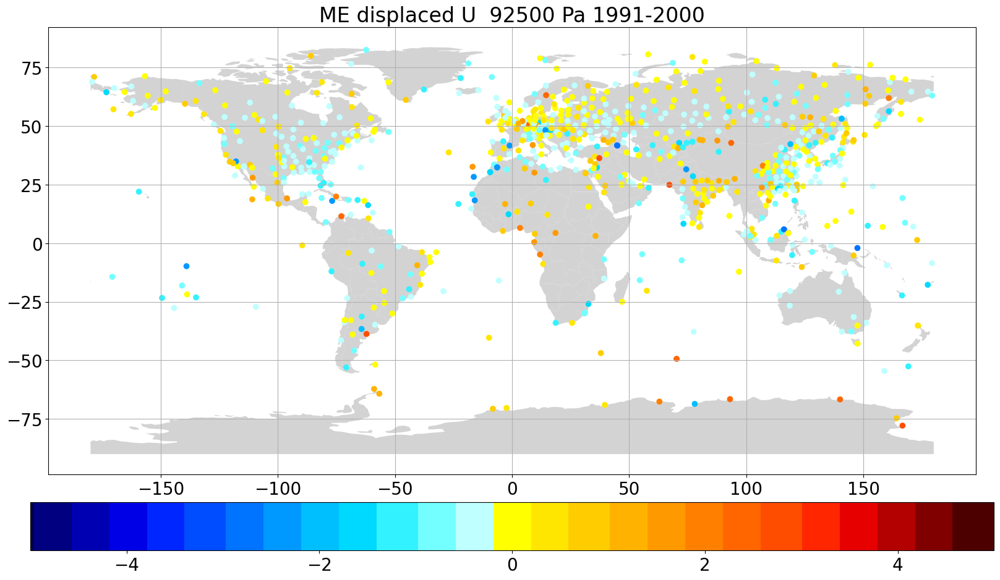

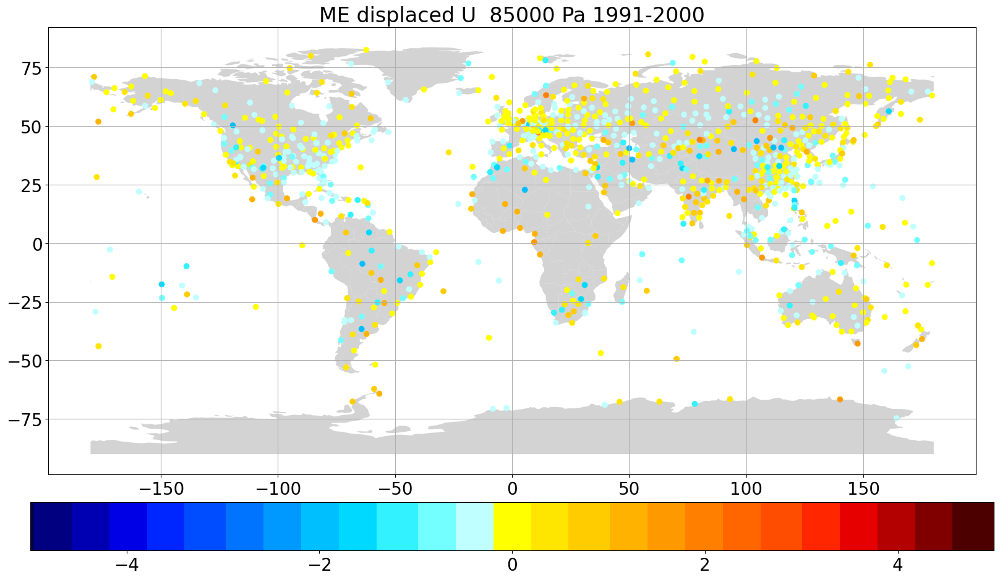

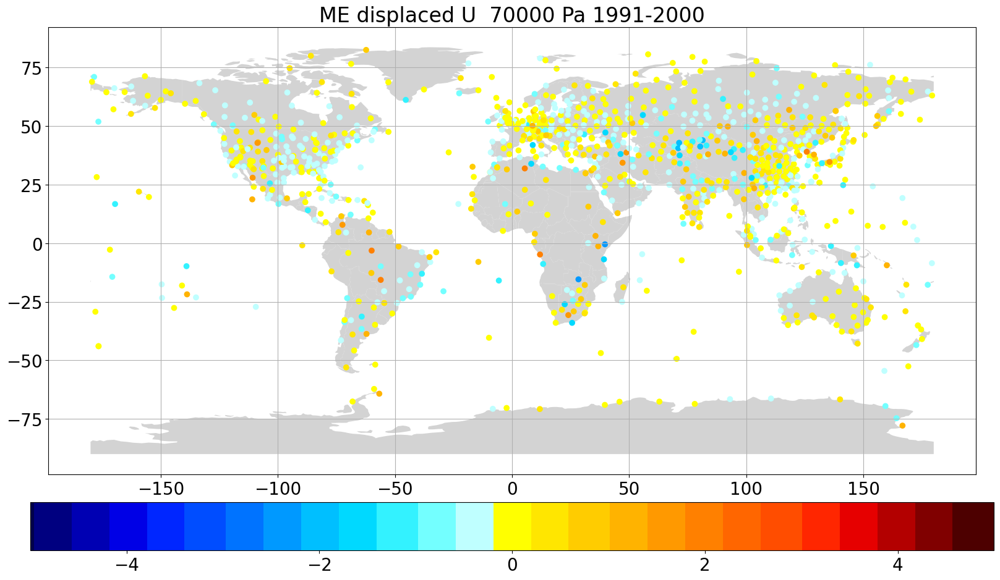

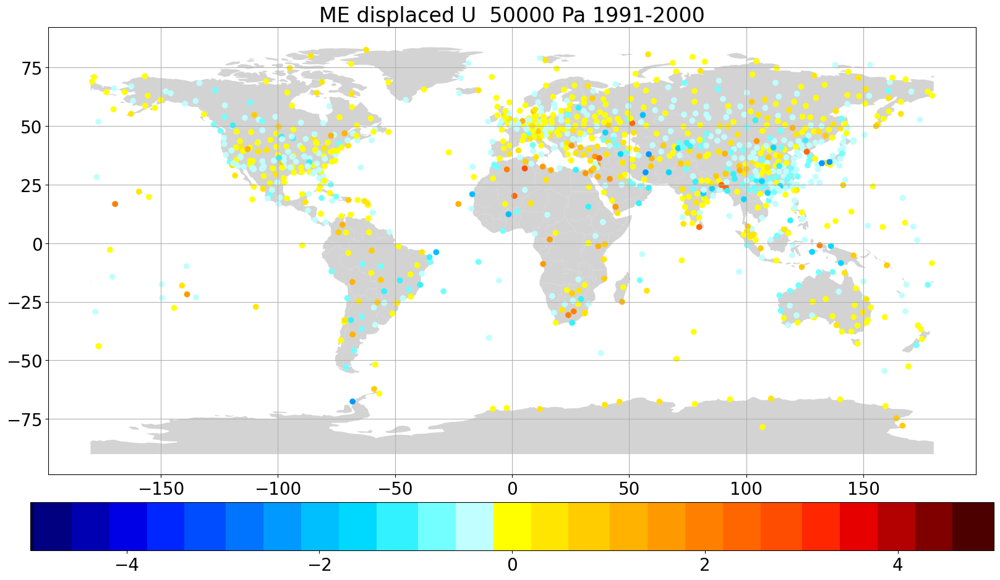

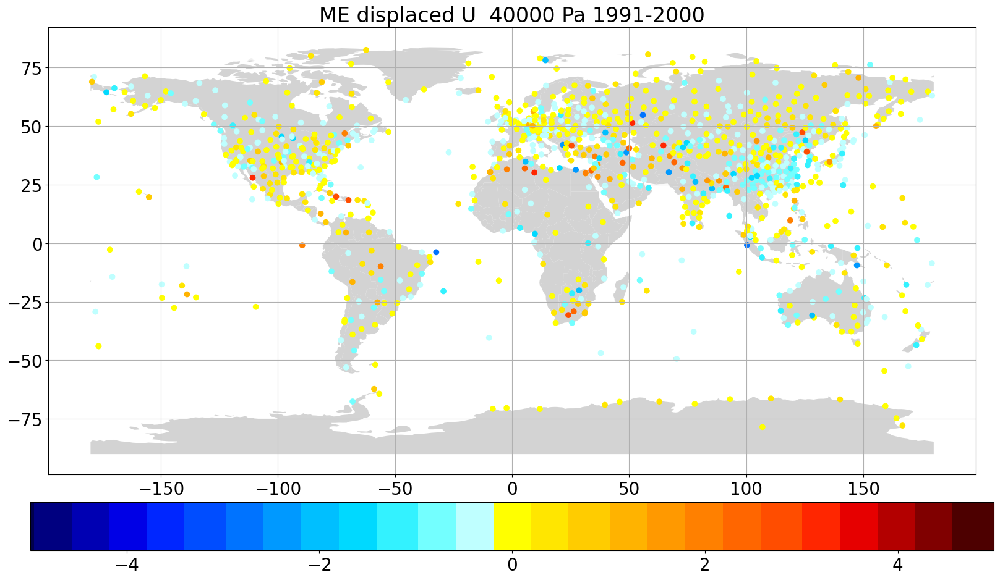

...

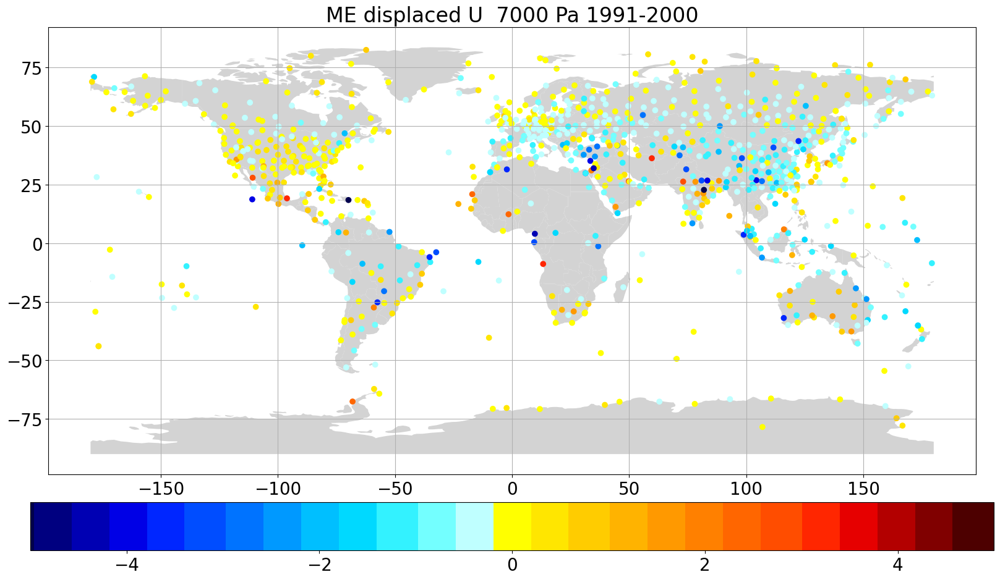

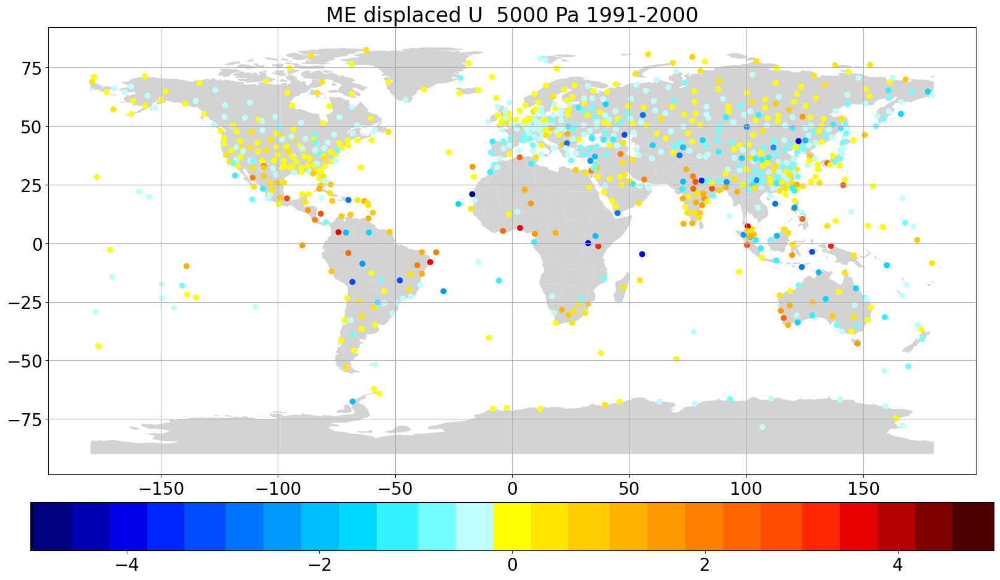

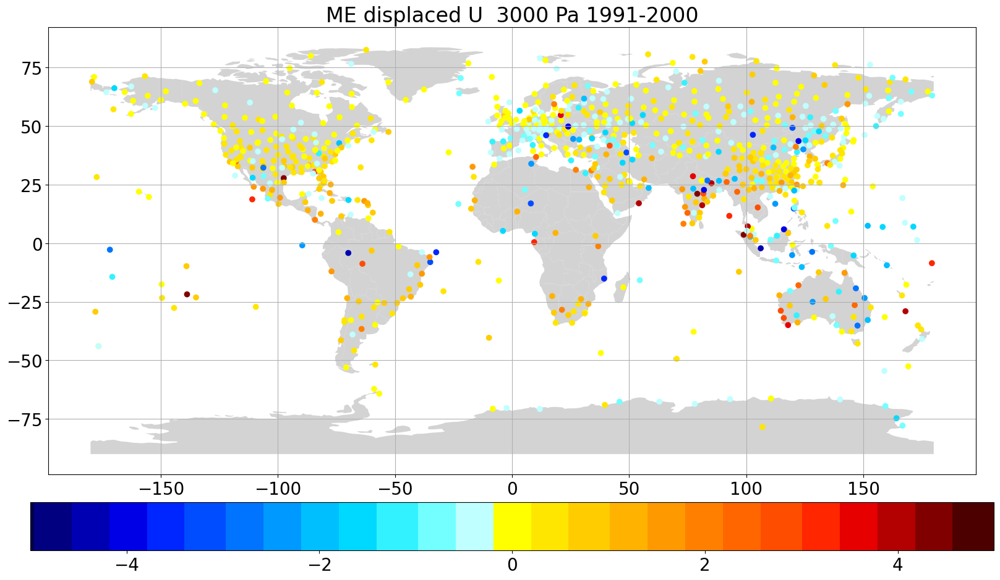

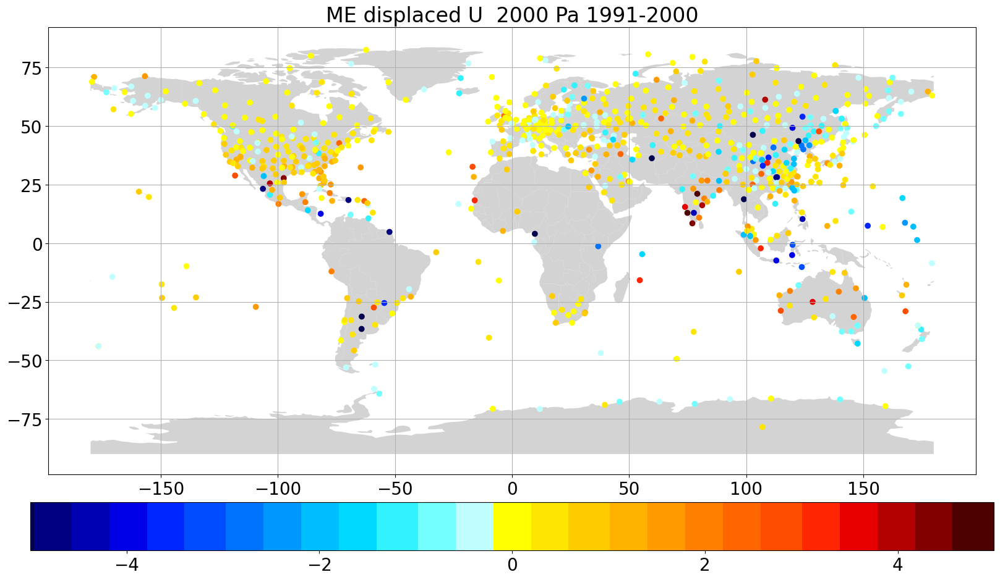

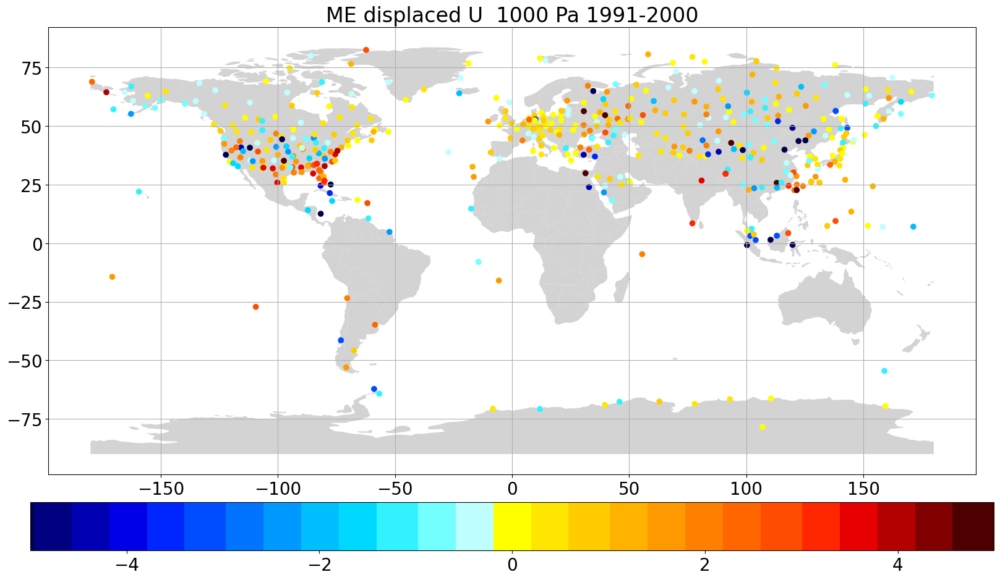

In [5]:
var = 'U'
year = '1991-2000'
files = glob.glob('./pre_calculated_rms data/era5_u_fc_*_rmse_data.p')
diffs, difflist = plot_year_me(files, str(year), param='disp')


diffarray = np.array(difflist)

outlier_cleaned_data = np.empty_like(diffarray)
outlier_cleaned_dict = copy.deepcopy(diffs)
limit = [1,99]
for i in range(np.shape(diffarray)[-1]):
    data = diffarray[:, i]
    outlier_drop = np.nanpercentile(data, limit)
    data[data < outlier_drop[0]] = np.nan
    data[data > outlier_drop[1]] = np.nan
    outlier_cleaned_data[:, i] = data
    
    for j in diffs:
        if (diffs[j][i] < outlier_drop[0]) or (diffs[j][i] > outlier_drop[1]):
            outlier_cleaned_dict[j][i] = np.nan
            
    
# stdplevs = [1000,2000,3000,5000,7000,10000,15000,20000,25000,30000,40000,50000,70000,85000,92500]
# fig, ax = maplt.subplots(5, 3, figsize = (15,15))
# fig.tight_layout()
# x = 0
# y = 0
# for i in range(0,15,1):
#     if y == 3:
#         x += 1
#         y = 0
#     ax[x][y].hist(outlier_cleaned_data[:, i], 50, range=(-1,1))
#     ax[x][y].set_title(str(stdplevs[i]) + ' Pa')
#     ax[x][y].grid()
    
#     y += 1
# # fig.show()
# fig.savefig("ME_displaced_"+var+"_hist_" + str(year) + '.png')


# stdplevs = [1000,2000,3000,5000,7000,10000,15000,20000,25000,30000,40000,50000,70000,85000,92500]
# fig, ax = maplt.subplots(5, 3, figsize = (15,15))
# fig.tight_layout()
# x = 0
# y = 0
# for i in range(0,15,1):
#     if y == 3:
#         x += 1
#         y = 0
#     ax[x][y].hist(outlier_cleaned_data[:, i], 2, range=(-1,1))
#     ax[x][y].set_title(str(stdplevs[i]) + ' Pa')
#     ax[x][y].grid()
#     y += 1
# # fig.show()
# fig.savefig("ME_displaced_"+var+"_binary_hist_" + str(year) + '.png')


def plt_world_map(lla, pl ,year):    
    fig, ax = plt.subplots(figsize=(18,10))# plot map on axis
    countries = gpd.read_file(  
    #      gpd.datasets.get_path("naturalearth_lowres"))countries[countries["name"] == "Australia"].plot(color="lightgrey",
    #                                                  ax=ax)# parse dates for plot's title
        gpd.datasets.get_path("naturalearth_lowres")).plot(color="lightgrey", ax=ax)# parse dates for plot's title
    plt1 = ax.scatter(x=lla["longitude"], y=lla["latitude"],
                c=lla["diff"], 
                cmap= cmnew,
                vmin=-5, vmax=5, #edgecolor='k',
              )
    ax.set_title("ME displaced "+var+" " + ' ' + str(pl) + ' Pa ' + str(year))
    ax.grid(b=True, alpha=1)
    plt.colorbar(plt1, orientation='horizontal', shrink=0.9, pad=0.05)
    plt.tight_layout()
    plt.show()
    fig.savefig("ME_displaced_"+var+"_" + str(pl) + '_Pa_' + str(year) + '.png')
    plt.close()
    
with open('/users/staff/uvoggenberger/scratch/hug/config/active.json') as fp:
    active = json.load(fp)
stdplevs = [1000,2000,3000,5000,7000,10000,15000,20000,25000,30000,40000,50000,70000,85000,92500]
diff_plot_input = {}
for p in range(len(stdplevs)):
    diff_plot_input[stdplevs[p]] = [[],[],[]]
    for i in diffs:
        for a in active:
            if i in a:
                if not np.isnan(diffs[i][p]):
                    diff_plot_input[stdplevs[p]][0].append(outlier_cleaned_dict[i][p])
                    diff_plot_input[stdplevs[p]][1].append(active[a][2])
                    diff_plot_input[stdplevs[p]][2].append(active[a][3])
                break

stdplevs = [1000,2000,3000,5000,7000,10000,15000,20000,25000,30000,40000,50000,70000,85000,92500]
for i in np.flip(stdplevs):
    df = pd.DataFrame(np.transpose(np.array(diff_plot_input[i])), columns =['diff', 'latitude', 'longitude'])
    plt_world_map(df, i, year)

# UNDISPLACED

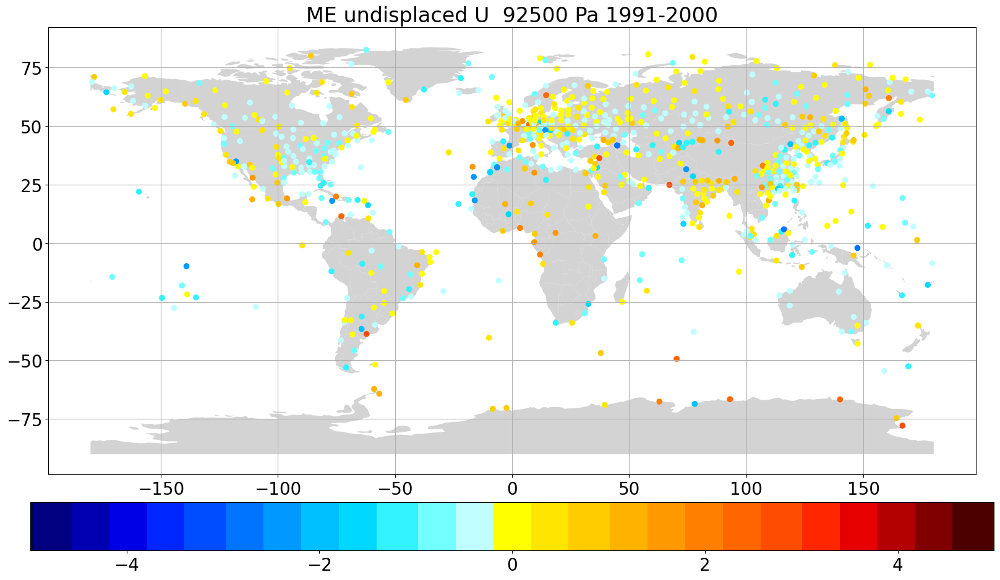

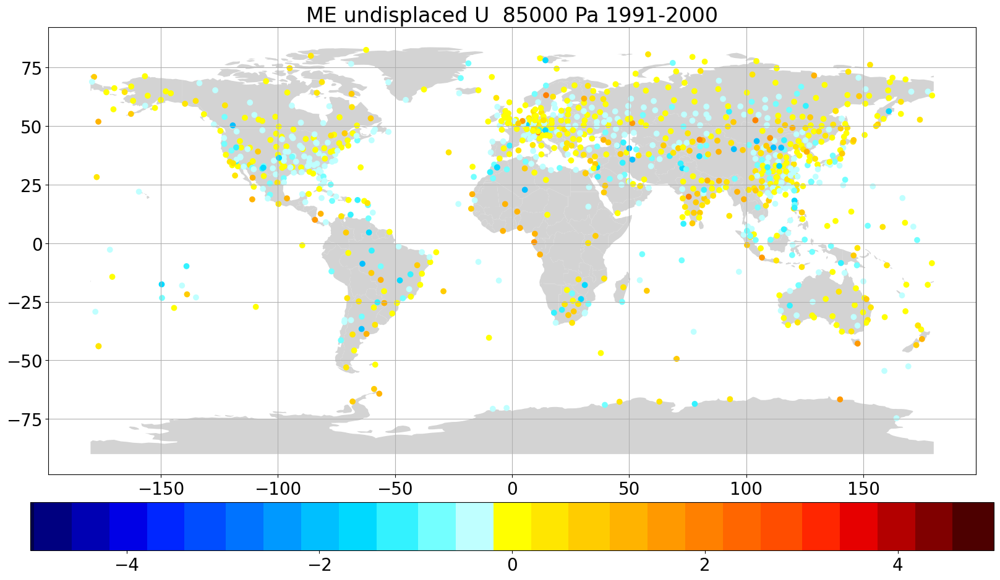

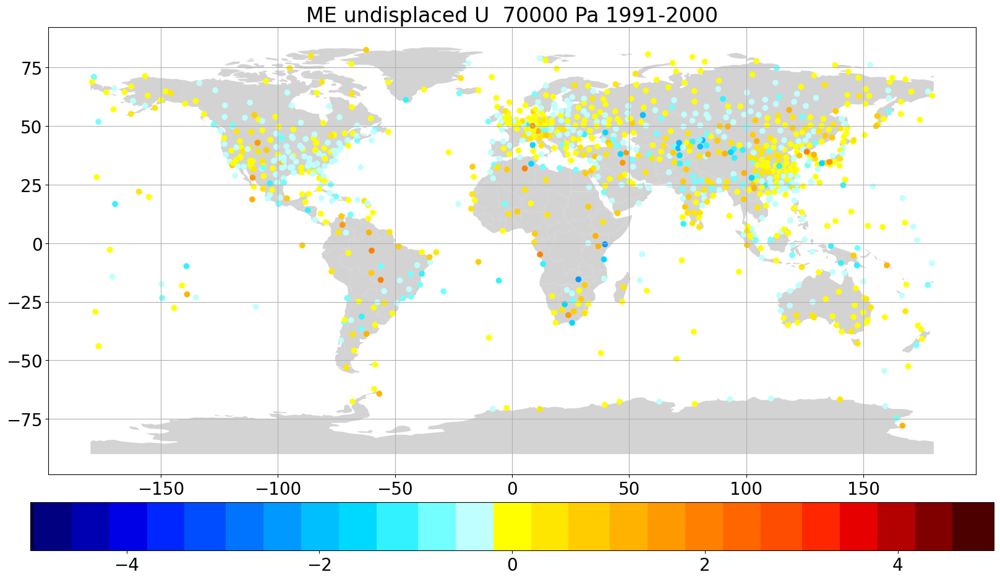

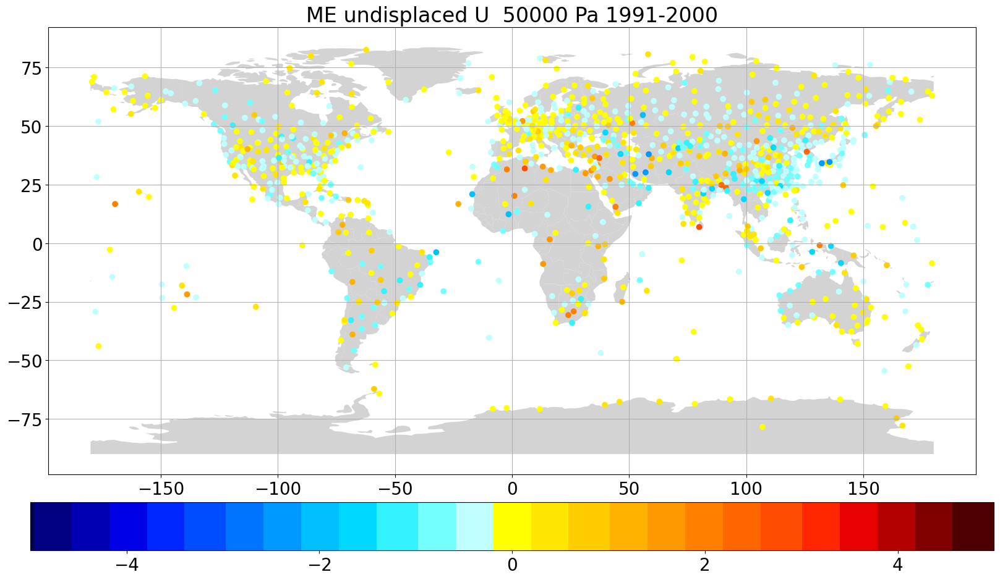

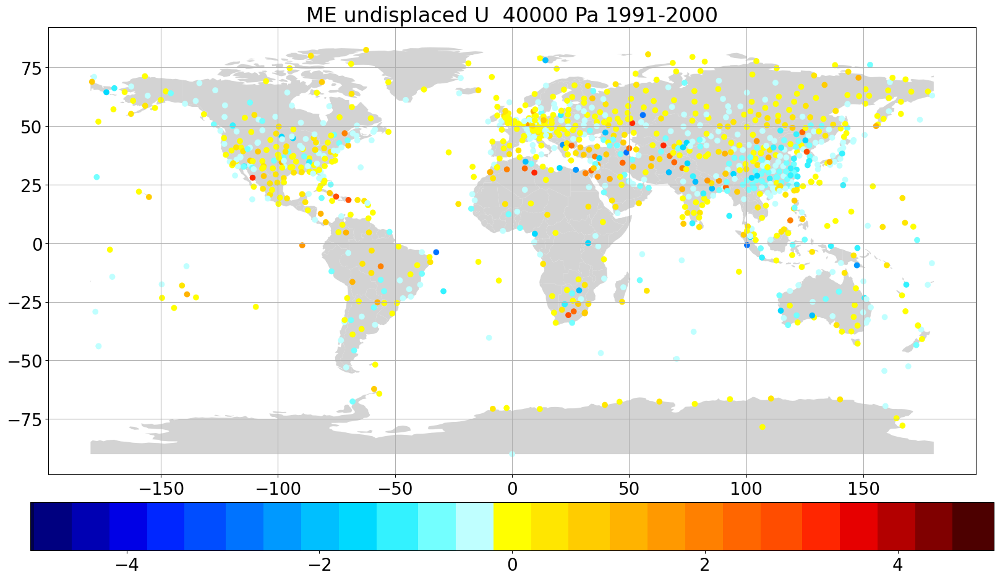

...

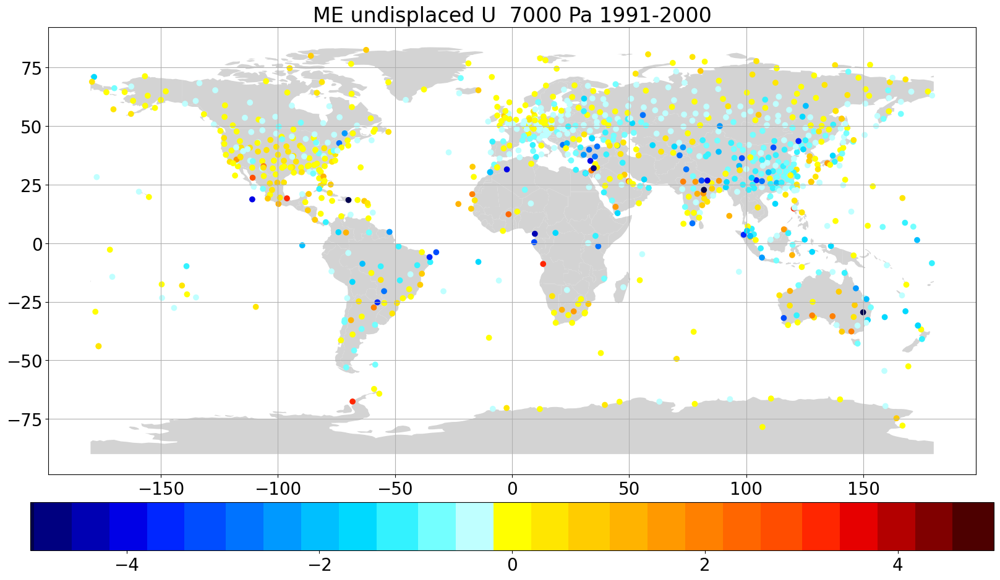

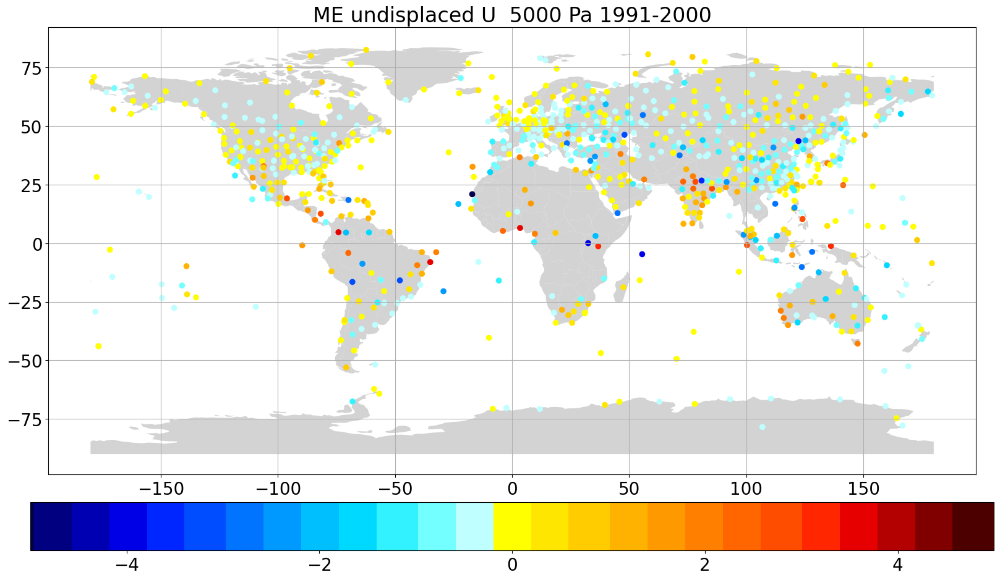

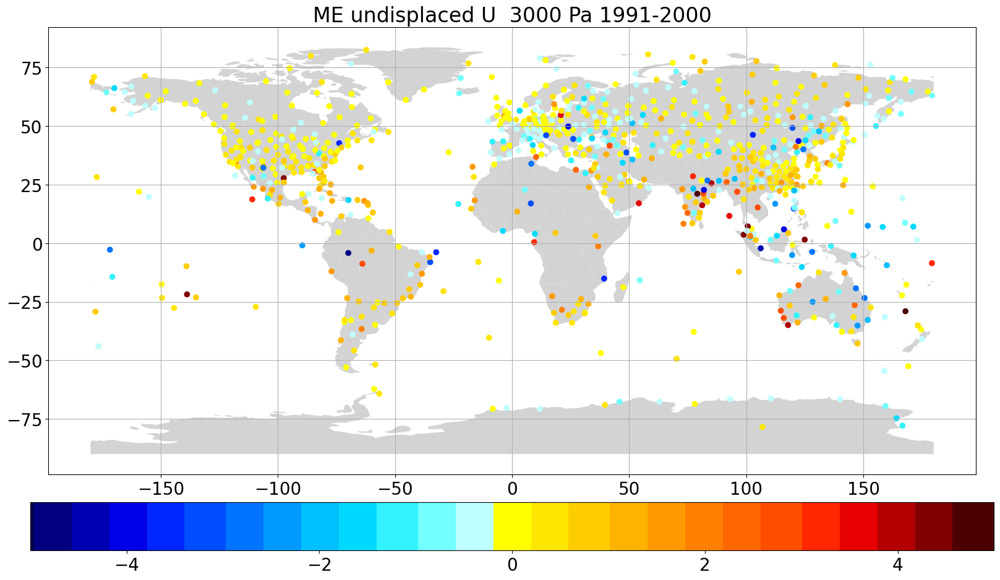

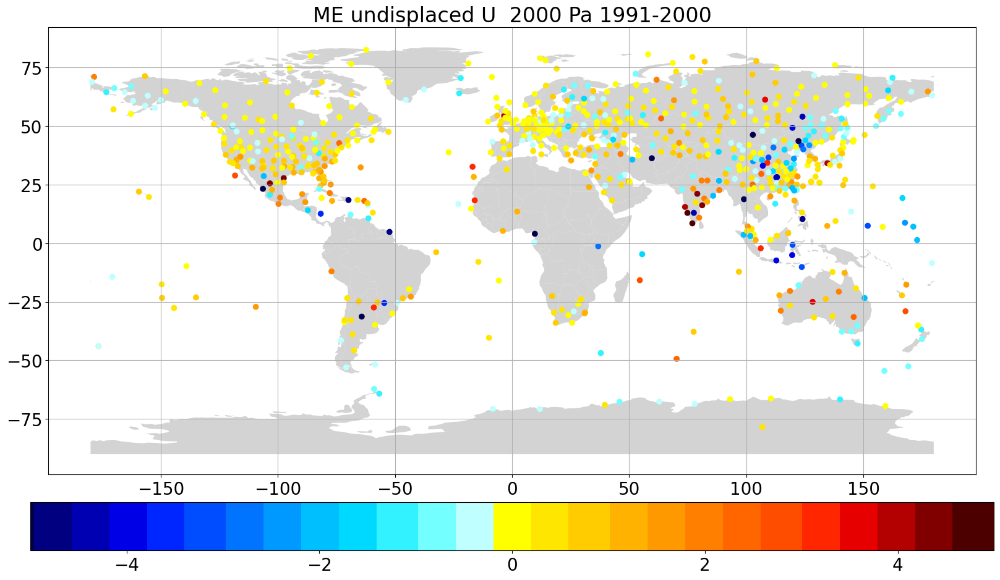

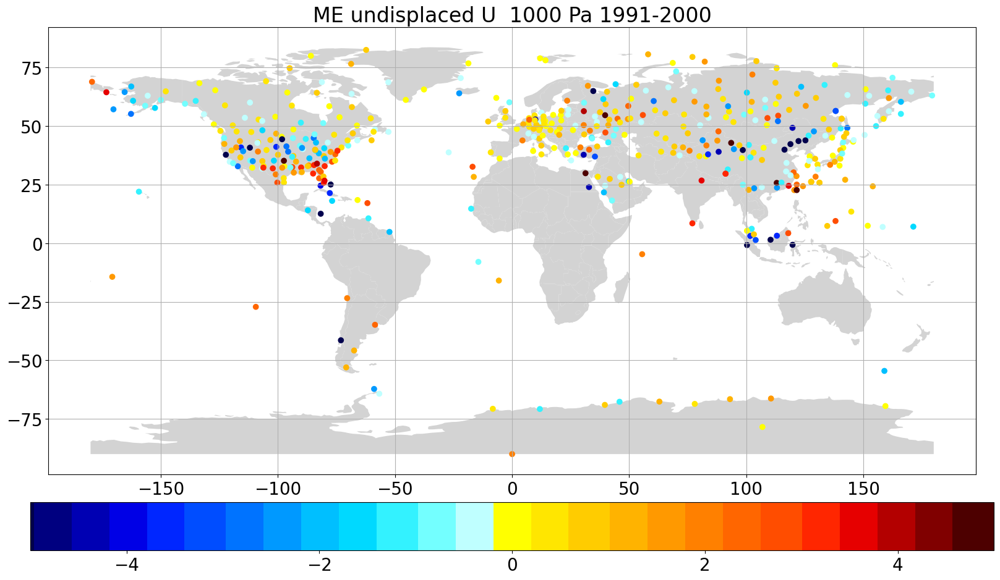

In [6]:
var = 'U'
year = '1991-2000'
files = glob.glob('./pre_calculated_rms data/era5_u_fc_*_rmse_data.p')
diffs, difflist = plot_year_me(files, str(year), param='undisp')


diffarray = np.array(difflist)

outlier_cleaned_data = np.empty_like(diffarray)
outlier_cleaned_dict = copy.deepcopy(diffs)
limit = [1,99]
for i in range(np.shape(diffarray)[-1]):
    data = diffarray[:, i]
    outlier_drop = np.nanpercentile(data, limit)
    data[data < outlier_drop[0]] = np.nan
    data[data > outlier_drop[1]] = np.nan
    outlier_cleaned_data[:, i] = data
    
    for j in diffs:
        if (diffs[j][i] < outlier_drop[0]) or (diffs[j][i] > outlier_drop[1]):
            outlier_cleaned_dict[j][i] = np.nan
            
    
# stdplevs = [1000,2000,3000,5000,7000,10000,15000,20000,25000,30000,40000,50000,70000,85000,92500]
# fig, ax = maplt.subplots(5, 3, figsize = (15,15))
# fig.tight_layout()
# x = 0
# y = 0
# for i in range(0,15,1):
#     if y == 3:
#         x += 1
#         y = 0
#     ax[x][y].hist(outlier_cleaned_data[:, i], 50, range=(-1,1))
#     ax[x][y].set_title(str(stdplevs[i]) + ' Pa')
#     ax[x][y].grid()
    
#     y += 1
# # fig.show()
# fig.savefig("ME_undisplaced_"+var+"_hist_" + str(year) + '.png')


# stdplevs = [1000,2000,3000,5000,7000,10000,15000,20000,25000,30000,40000,50000,70000,85000,92500]
# fig, ax = maplt.subplots(5, 3, figsize = (15,15))
# fig.tight_layout()
# x = 0
# y = 0
# for i in range(0,15,1):
#     if y == 3:
#         x += 1
#         y = 0
#     ax[x][y].hist(outlier_cleaned_data[:, i], 2, range=(-1,1))
#     ax[x][y].set_title(str(stdplevs[i]) + ' Pa')
#     ax[x][y].grid()
#     y += 1
# # fig.show()
# fig.savefig("ME_undisplaced_"+var+"_binary_hist_" + str(year) + '.png')


def plt_world_map(lla, pl ,year):    
    fig, ax = plt.subplots(figsize=(18,10))# plot map on axis
    countries = gpd.read_file(  
    #      gpd.datasets.get_path("naturalearth_lowres"))countries[countries["name"] == "Australia"].plot(color="lightgrey",
    #                                                  ax=ax)# parse dates for plot's title
        gpd.datasets.get_path("naturalearth_lowres")).plot(color="lightgrey", ax=ax)# parse dates for plot's title
    plt1 = ax.scatter(x=lla["longitude"], y=lla["latitude"],
                c=lla["diff"], 
                cmap= cmnew,
                vmin=-5, vmax=5, #edgecolor='k',
              )
    ax.set_title("ME undisplaced "+var+" " + ' ' + str(pl) + ' Pa ' + str(year))
    ax.grid(b=True, alpha=1)
    plt.colorbar(plt1, orientation='horizontal', shrink=0.9, pad=0.05)
    plt.tight_layout()
    plt.show()
    fig.savefig("ME_undisplaced_"+var+"_" + str(pl) + '_Pa_' + str(year) + '.png')
    plt.close()
    
with open('/users/staff/uvoggenberger/scratch/hug/config/active.json') as fp:
    active = json.load(fp)
stdplevs = [1000,2000,3000,5000,7000,10000,15000,20000,25000,30000,40000,50000,70000,85000,92500]
diff_plot_input = {}
for p in range(len(stdplevs)):
    diff_plot_input[stdplevs[p]] = [[],[],[]]
    for i in diffs:
        for a in active:
            if i in a:
                if not np.isnan(diffs[i][p]):
                    diff_plot_input[stdplevs[p]][0].append(outlier_cleaned_dict[i][p])
                    diff_plot_input[stdplevs[p]][1].append(active[a][2])
                    diff_plot_input[stdplevs[p]][2].append(active[a][3])
                break

stdplevs = [1000,2000,3000,5000,7000,10000,15000,20000,25000,30000,40000,50000,70000,85000,92500]
for i in np.flip(stdplevs):
    df = pd.DataFrame(np.transpose(np.array(diff_plot_input[i])), columns =['diff', 'latitude', 'longitude'])
    plt_world_map(df, i, year)